# Análisis de según el tipo de Vivienda

In [38]:
import geopandas as gdp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

### Tipo Vivienda Particular Ocupada

>Agregamos la variable "Tipo de Vivienda Particular Ocupada" al análisis de datos censales

Def: Son viviendas destinadas al alojamiento de uno o más hogares en donde las personas viven bajo un régimen de tipo familiar (sean o no parientes). Estas viviendas pueden haber sido construidas con fines habitacionales o estar adaptadas para alojar personas.

- Casa A: vivienda con salida directa al exterior (sus habitantes no pasan por pasillos o corredores
de uso común) construida originalmente para que habiten personas. Generalmente tiene
paredes de ladrillo, piedra, bloque u hormigón. No tiene condiciones deficitarias.

- Casa B: vivienda que presenta al menos una de las siguientes condiciones deficitarias: tiene piso
de tierra o ladrillo suelto u otro material (no tiene piso de cerámica, baldosa, mosaico, mármol,
madera, alfombra, cemento o ladrillo fijo); o no tiene provisión de agua por cañería dentro de la
vivienda o no dispone de inodoro con descarga de agua.

- Rancho: vivienda con salida directa al exterior (sus habitantes no pasan por pasillos o corredores
de uso común). Generalmente tiene paredes de adobe, piso de tierra y techo de chapa o paja. Es
característica de áreas rurales.

- Casilla: vivienda con salida directa al exterior, construida originalmente para que habiten
personas. Habitualmente fabricada con materiales de baja calidad o de desecho, es característica
de áreas urbanas.

- Departamento: vivienda que forma parte de un edificio o una estructura con una entrada
común que contiene, por lo menos, dos viviendas (o una vivienda y uno o más locales) a las que
se accede a través de pasillos, escaleras, zaguanes o ascensores de uso común.

- Pieza ocupada en inquilinato, hotel familiar o pensión: ambiente o cuarto ubicado en un
inquilinato, un hotel familiar, una pensión o un conventillo. Estos son edificios o estructuras
construidos o remodelados deliberadamente para contener varias piezas con salida a uno o más
espacios de uso común, con la finalidad de alojar personas en forma permanente en calidad de
inquilinos, huéspedes o pensionistas. Generalmente la edificación tiene baños o cocinas de uso
compartido; esto no excluye que alguna de las habitaciones cuente con baño o cocina propios.
El hotel familiar se caracteriza por pago diario, semanal, quincenal o mensual del importe del
alojamiento y encuadramiento bajo la legislación establecida para este tipo de comercio que se
exhibe en lugares visibles o en los libros de registro del establecimiento. Cada pieza ocupada de
inquilinato, en hotel o pensión familiar en la que residen habitualmente personas es considerada
una vivienda.

- Local no construido para habitación ocupado: lugar o recinto de alojamiento estructuralmente
separado e independiente –con o sin una entrada común– que no ha sido construido o adaptado
para que habiten personas, pero que al momento del Censo es ocupado por personas.

- Vivienda móvil ocupada (casa rodante, barco, carpa u otra): estructura construida para ser
transportada (tienda de campaña o carpa) o que constituye una unidad móvil (barco, bote, vagón
de ferrocarril, casa rodante, camión, etc.) y que se utiliza como vivienda. Se considera vivienda
particular solo si está ocupada por personas al momento del Censo

----------

In [39]:
# Cargamos los archivos que veniamos usando
datos_censales_con_gdf = gdp.read_file("../data/processed/datos_censales_con_gdf.gpkg")

In [40]:
datos_censales_con_gdf.columns

Index(['NOMPROV', 'PROV', 'NOMDEPTO', 'DEPTO', 'FRAC', 'RADIO', 'TIPO', 'LINK',
       'OBS2020', 'CodigoFraccion', 'CodigoRadioCensal', 'NBI_Hacinamiento_Si',
       'NBI_Hacinamiento_No', 'NBI_Vivienda_Si', 'NBI_Vivienda_No',
       'NBI_Sanitarias_Si', 'NBI_Sanitarias_No', 'NBI_Escolaridad_Si',
       'NBI_Escolaridad_No', 'NBI_Subsistencia_Si', 'NBI_Subsistencia_No',
       'NBI_Si', 'NBI_No', 'Sin_IPMH', 'IPMH_Solo_Recursos_Corrientes',
       'IPMH_Solo_Recursos_Patrimoniales', 'IPMH_Convergente', 'Total_Hogares',
       'Total_Poblacion', 'hogares_en_casa_a', 'hogares_en_casa_b',
       'hogares_en_rancho', 'hogares_en_casilla', 'hogares_en_departamento',
       'hogares_en_pieza_inquilinato', 'hogares_en_local_no_hab',
       'hogares_en_vivienda_movil', 'viv_casa_a', 'viv_casa_b', 'viv_rancho',
       'viv_casilla', 'viv_departamento', 'viv_pieza_inquilinato',
       'viv_local_no_hab', 'viv_vivienda_movil', 'Total_Viviendas',
       'tasa_NBI_%', 'NBI_Si_tasa_categorizado', '

> Hacemos un análisis exploratorio de la variable "Tipo Vivienda Particular Ocupada"

In [41]:
datos_censales_con_gdf[
    ["viv_casa_a", "viv_casa_b", "viv_rancho", "viv_casilla", "viv_departamento",
     "viv_pieza_inquilinato", "viv_local_no_hab", "viv_vivienda_movil", "Total_Viviendas"]
].describe()

,viv_casa_a,viv_casa_b,viv_rancho,viv_casilla,viv_departamento,viv_pieza_inquilinato,viv_local_no_hab,viv_vivienda_movil,Total_Viviendas
count,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000
mean,139.786458,18.527995,2.011068,1.822917,93.633464,1.695964,0.490885,0.140625,258.109375
std,91.323529,31.821149,5.760972,4.518354,106.519465,3.373881,1.470640,0.488049,75.607066
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,49.000000,1.000000,0.000000,0.000000,11.000000,0.000000,0.000000,0.000000,204.000000
50%,146.000000,5.000000,0.000000,0.000000,37.000000,1.000000,0.000000,0.000000,251.000000
75%,209.000000,22.000000,1.000000,2.000000,166.000000,2.000000,0.000000,0.000000,304.250000
max,382.000000,257.000000,92.000000,81.000000,639.000000,50.000000,24.000000,6.000000,694.000000


Agregamos las proporciones de cada una de las nuevas variables

In [42]:
cols_viv = ["viv_casa_a", "viv_casa_b", "viv_rancho", "viv_casilla", "viv_departamento",
     "viv_pieza_inquilinato", "viv_local_no_hab", "viv_vivienda_movil"]

for col in cols_viv:
    datos_censales_con_gdf[f"tasa_{col}_%"] = (
        datos_censales_con_gdf[col] / datos_censales_con_gdf["Total_Viviendas"] * 100
    )

datos_censales_con_gdf[[f"tasa_{col}_%" for col in cols_viv]].describe()

,tasa_viv_casa_a_%,tasa_viv_casa_b_%,tasa_viv_rancho_%,tasa_viv_casilla_%,tasa_viv_departamento_%,tasa_viv_pieza_inquilinato_%,tasa_viv_local_no_hab_%,tasa_viv_vivienda_movil_%
count,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000
mean,54.849904,7.064574,0.748709,0.685666,35.746507,0.655396,0.195114,0.054131
std,31.843261,11.467900,2.044457,1.580654,35.766430,1.278997,0.622683,0.192165
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.597788,0.460829,0.000000,0.000000,4.320829,0.000000,0.000000,0.000000
50%,64.875181,1.843357,0.000000,0.000000,14.916376,0.352113,0.000000,0.000000
75%,84.167104,8.768362,0.536205,0.800803,75.355727,0.744880,0.000000,0.000000
max,100.000000,71.428571,22.772277,17.685590,98.507463,14.577259,11.267606,2.777778


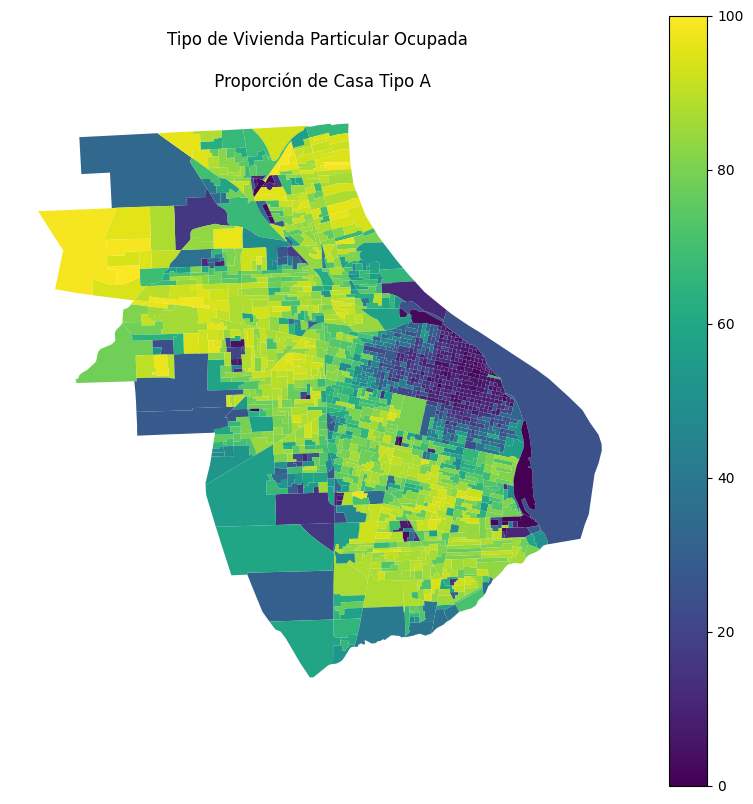

In [43]:
# Grafico de la proporcion de casa tipo a en cada radio censal

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

datos_censales_con_gdf.plot(
    column="tasa_viv_casa_a_%", 
    cmap="viridis", 
    legend=True
    ,ax=ax
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Proporción de Casa Tipo A")
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")
ax.axis('off')
plt.show()

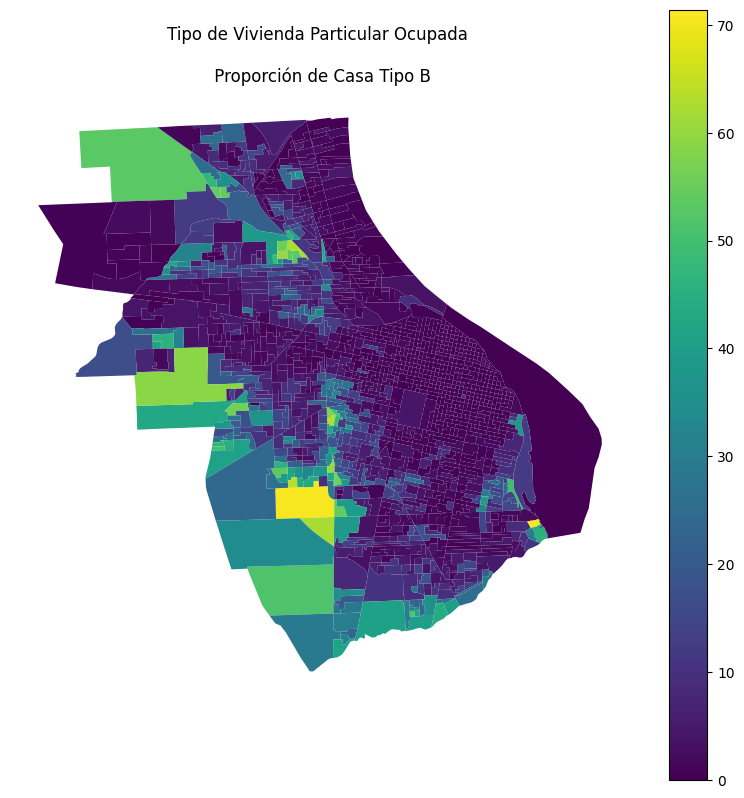

In [44]:
# Grafico de la proporcion de casa tipo B en cada radio censal

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

datos_censales_con_gdf.plot(
    column="tasa_viv_casa_b_%", 
    cmap="viridis", 
    legend=True
    ,ax=ax
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Proporción de Casa Tipo B")
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")
ax.axis('off')
plt.show()

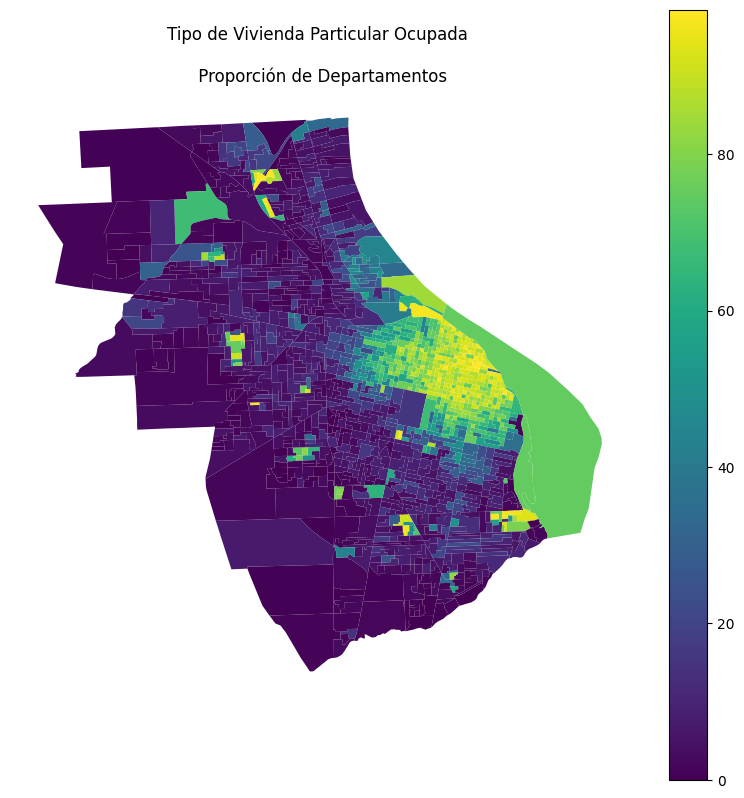

In [45]:
# Grafico de la proporcion de departamentos en cada radio censal

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

datos_censales_con_gdf.plot(
    column="tasa_viv_departamento_%", 
    cmap="viridis", 
    legend=True
    ,ax=ax
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Proporción de Departamentos")
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")
ax.axis('off')
plt.show()

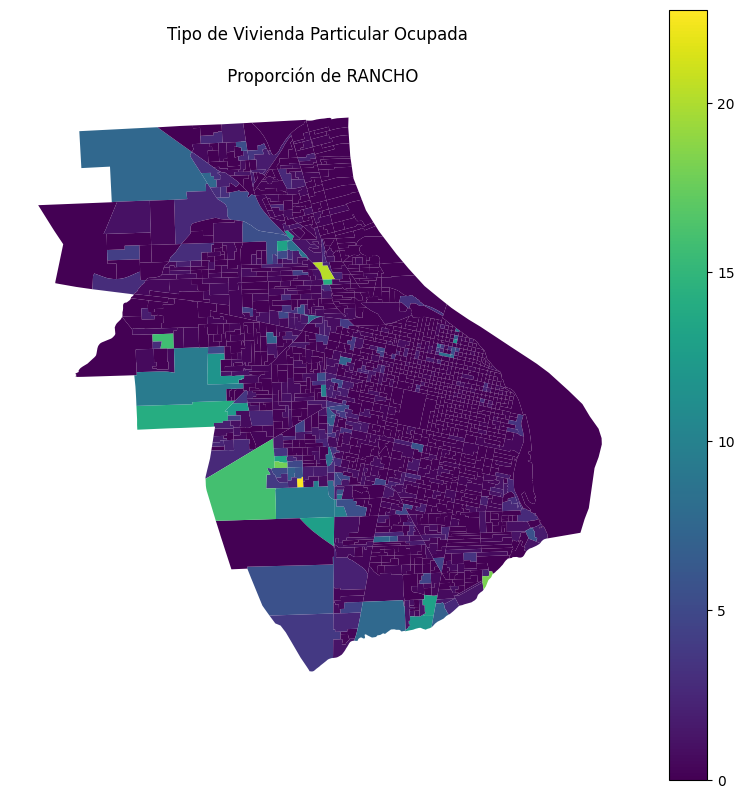

In [46]:
# Grafico de la proporcion de RANCHO en cada radio censal

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

datos_censales_con_gdf.plot(
    column="tasa_viv_rancho_%", 
    cmap="viridis", 
    legend=True
    ,ax=ax
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Proporción de RANCHO")
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")
ax.axis('off')
plt.show()

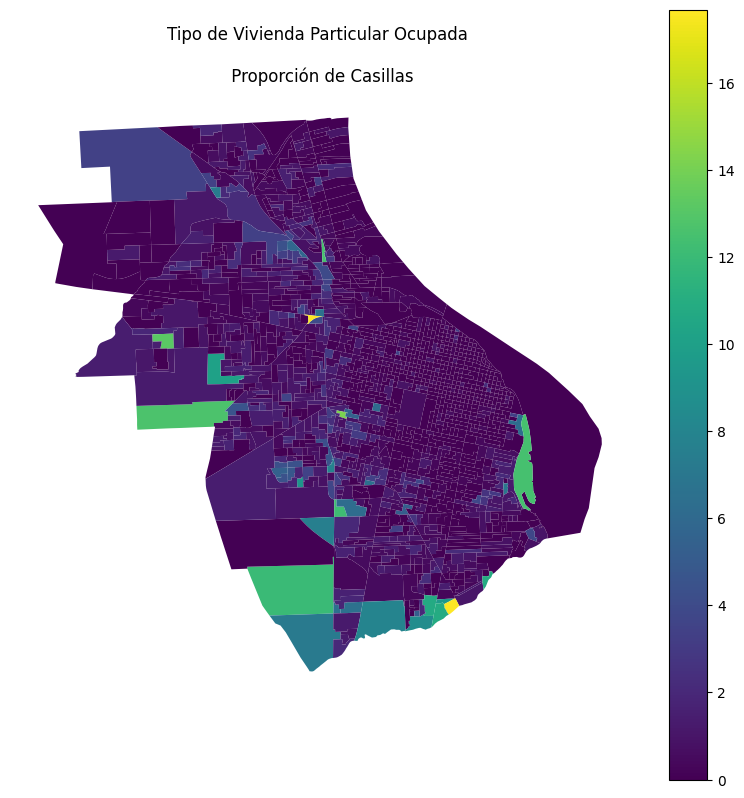

In [47]:
# Grafico de la proporcion de casillas en cada radio censal

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

datos_censales_con_gdf.plot(
    column="tasa_viv_casilla_%", 
    cmap="viridis", 
    legend=True
    ,ax=ax
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Proporción de Casillas")
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")
ax.axis('off')
plt.show()

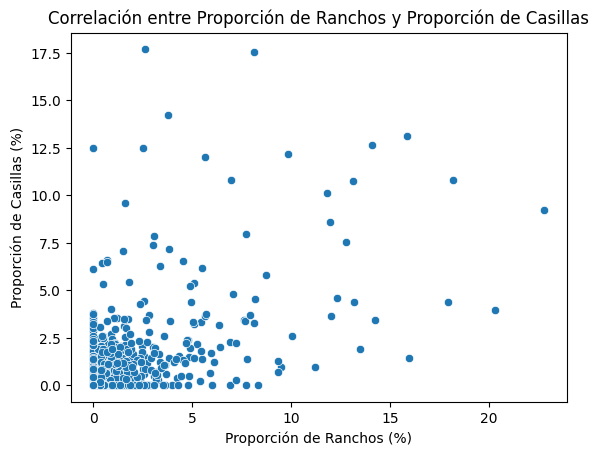

Correlación entre Proporción de Ranchos y Proporción de Casillas: 0.41676225691625984


In [48]:
# Correlacion entre proporcion rancho y proporcion casilla
sns.scatterplot(
    data=datos_censales_con_gdf,
    x="tasa_viv_rancho_%",
    y="tasa_viv_casilla_%"
)
plt.title("Correlación entre Proporción de Ranchos y Proporción de Casillas")
plt.xlabel("Proporción de Ranchos (%)")
plt.ylabel("Proporción de Casillas (%)")
plt.show()

#Calculamos correlacion entre esas dos variables
# Quiero que ambas sean mayores a cero para evitar distorsiones
datos_censales_con_gdf_aux = datos_censales_con_gdf[
    (datos_censales_con_gdf["tasa_viv_rancho_%"] > 1) & (datos_censales_con_gdf["tasa_viv_casilla_%"] > 1)
]

correlacion = datos_censales_con_gdf_aux["tasa_viv_rancho_%"].corr(
    datos_censales_con_gdf_aux["tasa_viv_casilla_%"]
)
print(f"Correlación entre Proporción de Ranchos y Proporción de Casillas: {correlacion}")

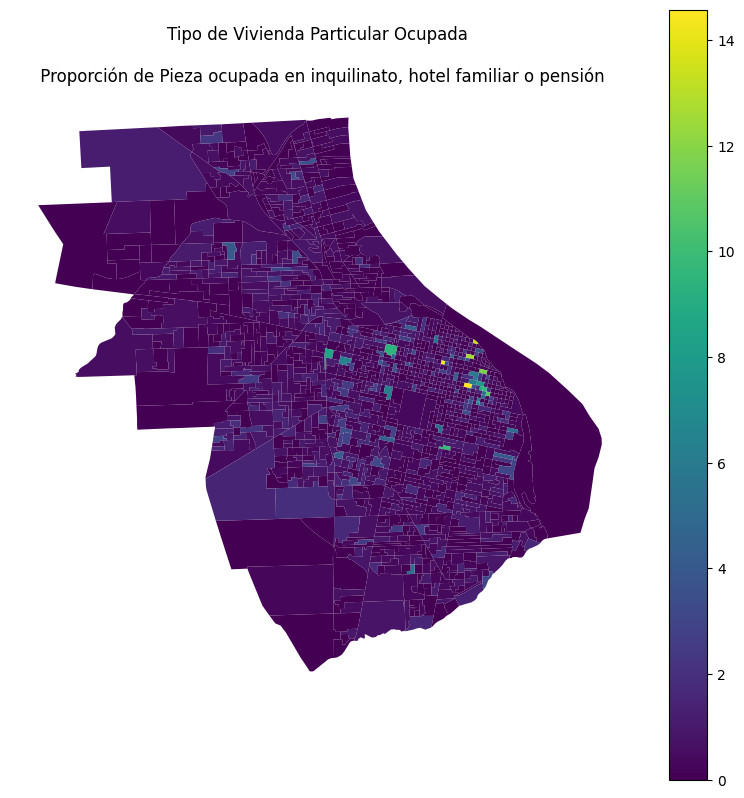

In [49]:
# Grafico de la proporcion de Pieza ocupada en inquilinato, hotel familiar o pensión en cada radio censal

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

datos_censales_con_gdf.plot(
    column="tasa_viv_pieza_inquilinato_%", 
    cmap="viridis", 
    legend=True
    ,ax=ax
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Proporción de Pieza ocupada en inquilinato, hotel familiar o pensión")
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")
ax.axis('off')
plt.show()

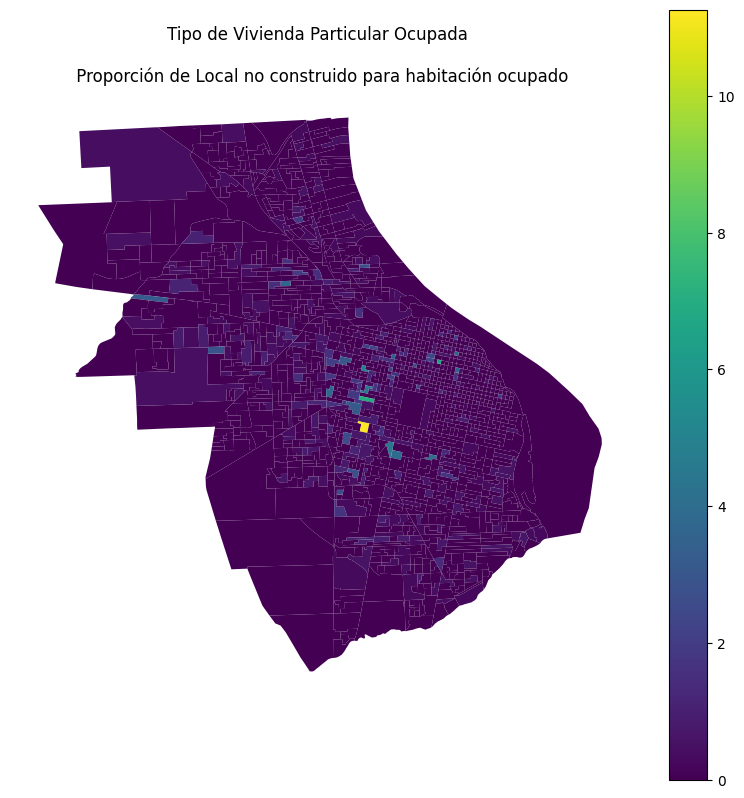

In [51]:
# Grafico de la proporcion de Local no construido para habitación ocupado en cada radio censal

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

datos_censales_con_gdf.plot(
    column="tasa_viv_local_no_hab_%", 
    cmap="viridis", 
    legend=True
    ,ax=ax
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Proporción de Local no construido para habitación ocupado")
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")
ax.axis('off')
plt.show()

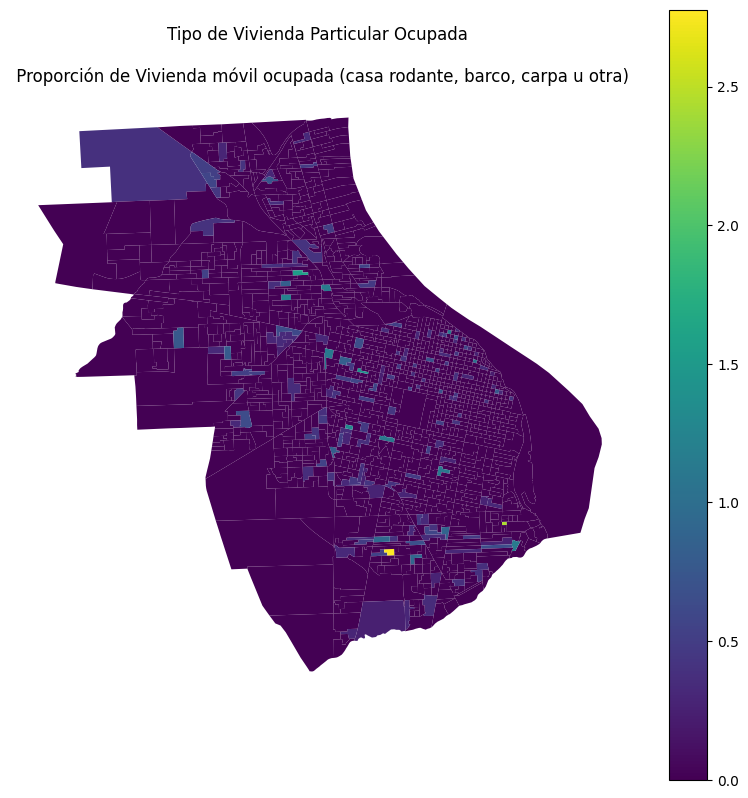

In [52]:
# Grafico de la proporcion de Vivienda móvil ocupada (casa rodante, barco, carpa u otra) en cada radio censal

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
	
datos_censales_con_gdf.plot(
    column="tasa_viv_vivienda_movil_%", 
    cmap="viridis", 
    legend=True
    ,ax=ax
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Proporción de Vivienda móvil ocupada (casa rodante, barco, carpa u otra)")
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")
ax.axis('off')
plt.show()

In [53]:
datos_censales_con_gdf.columns

Index(['NOMPROV', 'PROV', 'NOMDEPTO', 'DEPTO', 'FRAC', 'RADIO', 'TIPO', 'LINK',
       'OBS2020', 'CodigoFraccion', 'CodigoRadioCensal', 'NBI_Hacinamiento_Si',
       'NBI_Hacinamiento_No', 'NBI_Vivienda_Si', 'NBI_Vivienda_No',
       'NBI_Sanitarias_Si', 'NBI_Sanitarias_No', 'NBI_Escolaridad_Si',
       'NBI_Escolaridad_No', 'NBI_Subsistencia_Si', 'NBI_Subsistencia_No',
       'NBI_Si', 'NBI_No', 'Sin_IPMH', 'IPMH_Solo_Recursos_Corrientes',
       'IPMH_Solo_Recursos_Patrimoniales', 'IPMH_Convergente', 'Total_Hogares',
       'Total_Poblacion', 'hogares_en_casa_a', 'hogares_en_casa_b',
       'hogares_en_rancho', 'hogares_en_casilla', 'hogares_en_departamento',
       'hogares_en_pieza_inquilinato', 'hogares_en_local_no_hab',
       'hogares_en_vivienda_movil', 'viv_casa_a', 'viv_casa_b', 'viv_rancho',
       'viv_casilla', 'viv_departamento', 'viv_pieza_inquilinato',
       'viv_local_no_hab', 'viv_vivienda_movil', 'Total_Viviendas',
       'tasa_NBI_%', 'NBI_Si_tasa_categorizado', '

In [65]:
# Guardamos el dataframe modificado recientemente
# datos_censales_con_gdf.to_file('../data/processed/datos_censales_con_gdf.gpkg', driver='GPKG')

In [55]:
# Total de viviendas tipo rancho en la ciudad
datos_censales_con_gdf[["viv_rancho"]].sum()

viv_rancho    3089
dtype: int64

In [56]:
# Los 10 radios censales con mayor proporcion de ranchos
datos_censales_con_gdf.nlargest(10, "tasa_viv_rancho_%")[["CodigoRadioCensal", "tasa_viv_rancho_%"]]

,CodigoRadioCensal,tasa_viv_rancho_%
98,820844914,22.772277
237,820840811,20.309051
1316,820845529,18.181818
104,820844920,17.948718
1178,820844901,15.942029
1459,820848418,15.830116
250,820840907,14.215686
783,820843315,14.084507
102,820844918,13.461538
292,820841035,13.200000


Como la mayoria de los radios tienen CERO ranchos, filtramos por aquellos que tienen por lo menos 1 rancho para ver su distribución en el boxplot.

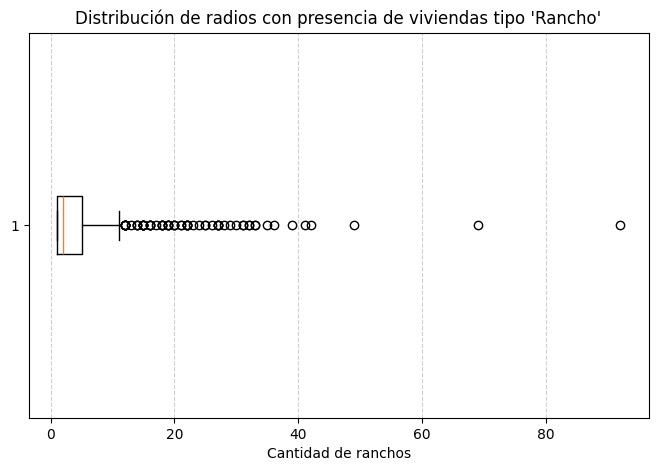

Estadisticos descriptivos viviendas tipo rancho por radio censal (solo radios con al menos 1 rancho):
count    585.000000
mean       5.280342
std        8.363123
min        1.000000
25%        1.000000
50%        2.000000
75%        5.000000
max       92.000000
Name: viv_rancho, dtype: float64


In [59]:
radios_con_ranchos = datos_censales_con_gdf[datos_censales_con_gdf["viv_rancho"] > 0]

plt.figure(figsize=(8, 5))
plt.boxplot(radios_con_ranchos["viv_rancho"], vert=False)
plt.title("Distribución de radios con presencia de viviendas tipo 'Rancho'")
plt.xlabel("Cantidad de ranchos")
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.show()

print("Estadisticos descriptivos viviendas tipo rancho por radio censal (solo radios con al menos 1 rancho):")
print(radios_con_ranchos["viv_rancho"].describe())

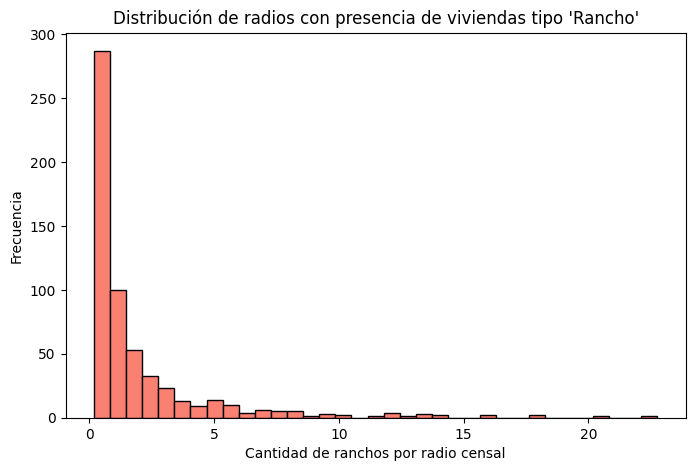

In [60]:
plt.figure(figsize=(8, 5))
plt.hist(radios_con_ranchos["tasa_viv_rancho_%"], bins=35, color="salmon", edgecolor="black")
plt.title("Distribución de radios con presencia de viviendas tipo 'Rancho'")
plt.xlabel("Cantidad de ranchos por radio censal")
#Aumentamos la frecuencia del eje x
plt.ylabel("Frecuencia")
plt.show()

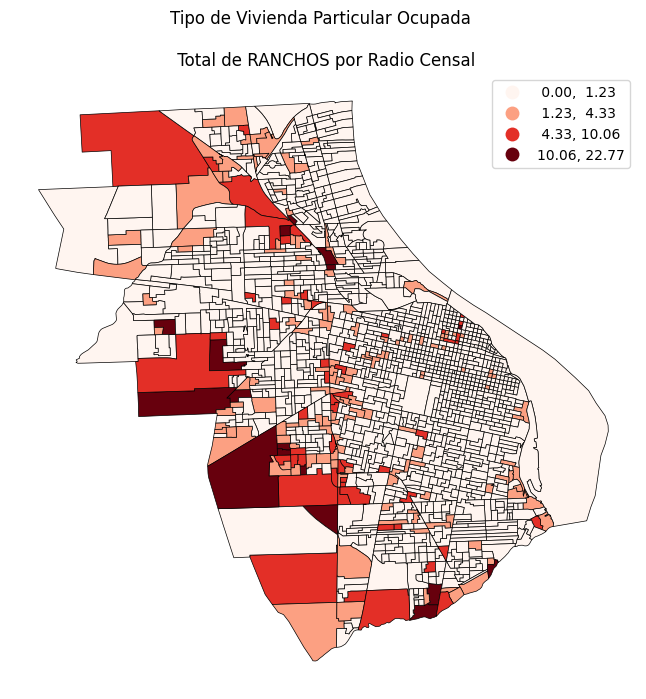

In [61]:
# Agrupamos los datos donde hay saltos naturales entre valores 
# —útil para datos muy desbalanceados.
import mapclassify

datos_censales_con_gdf.plot(
    column="tasa_viv_rancho_%",
    cmap="Reds",
    scheme="NaturalBreaks",
    k=4,  # número de clases
    edgecolor='black',
    linewidth=0.5,
    legend=True,
    figsize=(10, 8)
)

plt.title("Tipo de Vivienda Particular Ocupada \n\n Total de RANCHOS por Radio Censal")
plt.axis('off')
plt.show()

Mas del 50% de los radios censales tienen una proporcion de ranchos igual a cero.

In [62]:
# Vemos los cuartiles de la variable prop_rancho
datos_censales_con_gdf["tasa_viv_rancho_%"].quantile([0.25, 0.5, 0.75, 1.0])

0.25     0.000000
0.50     0.000000
0.75     0.536205
1.00    22.772277
Name: tasa_viv_rancho_%, dtype: float64

La Media (Mean) de las proporciones positivas es: 1.965841

Conteo de la distribución final:
cat_prop_rancho_final
Nula                        951
Positivo: Bajo la Media     434
Positivo: Sobre la Media    151
Name: count, dtype: int64


/home/santiago/anaconda3/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_75813/2583566024.py:52: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  datos_censales_con_gdf.plot(


Text(0.5, 1.0, 'Distribución de Proporción de Ranchos por Categoría (Umbral: 1.9658407298968024)')

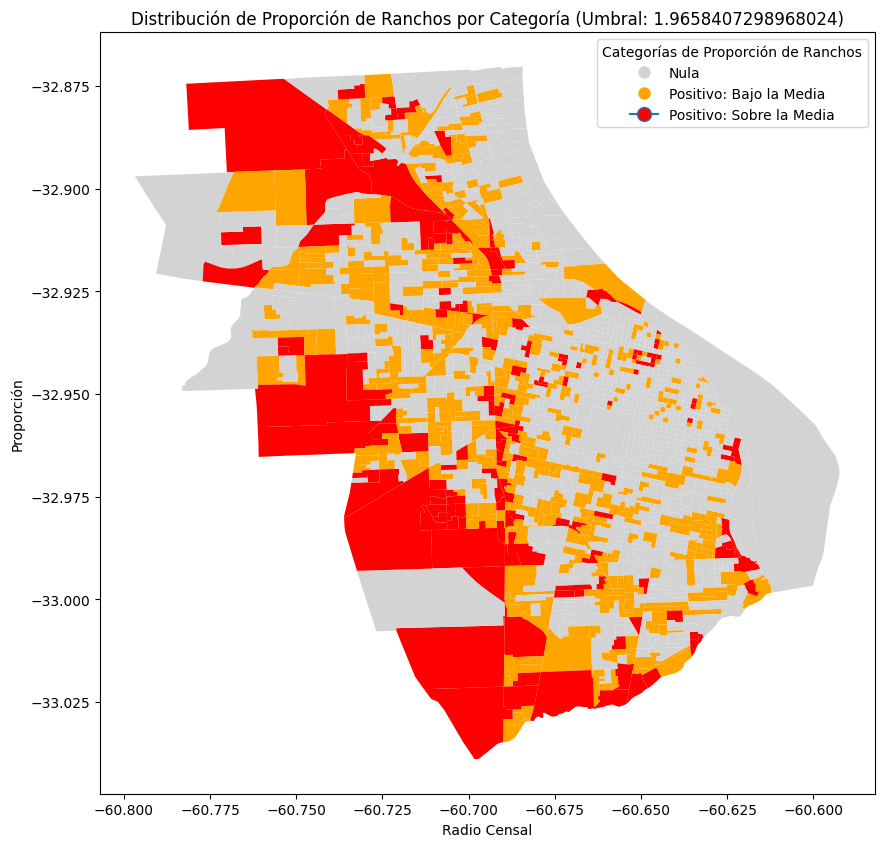

In [63]:
# Creamos 3 categorias, una para los que no tienen ranchos = prop_rancho = 0, 
# y la otra divimos en dos aquellos radios censales que tienen ranchos, 
# entre los que tienen baja proporcion y alta proporcion de ranchos.

# 1. Crear una máscara para los valores mayores a cero
datos_positivos = datos_censales_con_gdf[datos_censales_con_gdf['tasa_viv_rancho_%'] > 0]

media_positivos = datos_positivos['tasa_viv_rancho_%'].mean()
print(f"La Media (Mean) de las proporciones positivas es: {media_positivos:.6f}")

# 2. Definir los bins: desde el mínimo positivo, la media, hasta el máximo
bins_positivos_mean = [
    datos_positivos['tasa_viv_rancho_%'].min(), 
    media_positivos, 
    datos_positivos['tasa_viv_rancho_%'].max()
]

# 3. Usar pd.cut con los bins definidos
datos_positivos['cat_rancho_positivos'] = pd.cut(
    datos_positivos['tasa_viv_rancho_%'], 
    bins=bins_positivos_mean, 
    labels=['Positivo: Bajo la Media', 'Positivo: Sobre la Media'],
    include_lowest=True, 
    # Usamos 'drop' para manejar si la media coincide con muchos valores
    duplicates='drop'
)

# 4. Inicializar la nueva columna como 'Nula'
datos_censales_con_gdf['cat_prop_rancho_final'] = 'Nula'

# 5. Asignar las categorías calculadas a las filas positivas
# Asegúrate de que 'datos_positivos' contenga el índice correcto
datos_censales_con_gdf.loc[datos_positivos.index, 'cat_prop_rancho_final'] = datos_positivos['cat_rancho_positivos']

# Puedes revisar la distribución final:
print("\nConteo de la distribución final:")
print(datos_censales_con_gdf['cat_prop_rancho_final'].value_counts())

#Personalizamos color de cada categoria en 'cat_prop_rancho_final'
def asignar_color_categoria(categoria):
    if categoria == 'Nula':
        return 'lightgrey'  # Color para la categoría Nula
    elif categoria == 'Positivo: Bajo la Media':
        return 'orange'     # Color para la categoría Bajo la Media
    elif categoria == 'Positivo: Sobre la Media':
        return 'red'        # Color para la categoría Sobre la Media
    else:
        return 'black'      # Color por defecto (en caso de error)

# Graficamos el resultado
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
datos_censales_con_gdf.plot(
    column='cat_prop_rancho_hibrida', 
    color=datos_censales_con_gdf['cat_prop_rancho_final'].apply(asignar_color_categoria),
    #Definimos un cmap personalizado
    legend=True,
    ax=ax
)
#Agregams leyenda 
handles = [
    plt.Line2D([0], [0], marker='o', color='w', label='Nula', markerfacecolor='lightgrey', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Positivo: Bajo la Media', markerfacecolor='orange', markersize=10),
    plt.Line2D([0], [0], marker= 'o', label='Positivo: Sobre la Media', markerfacecolor='red', markersize=10)
]
ax.legend(handles=handles, title='Categorías de Proporción de Ranchos', loc='upper right')
plt.xlabel("Radio Censal")
plt.ylabel("Proporción")    
ax.set_title(f'Distribución de Proporción de Ranchos por Categoría (Umbral: {media_positivos})')

In [65]:
# Eliminamos la columna creada arriba
datos_censales_con_gdf.drop(columns=['cat_prop_rancho_final'], inplace=True)


--------

## Definimos dos nuevos tipos de viviendas
- **Viviendas adecuadas**: Casas tipo A + Departamentos

- **Viviendas inconvenientes** :  Casas tipo B + Ranchos + Casillas + Piezas en inquilinato, hotel o pension + Locales no construidos para habitar + Viviendas Moviles

El total de viviendas coincide (396.457 viviendas particulares ocupadas)

In [66]:
datos_censales_con_gdf.columns

Index(['NOMPROV', 'PROV', 'NOMDEPTO', 'DEPTO', 'FRAC', 'RADIO', 'TIPO', 'LINK',
       'OBS2020', 'CodigoFraccion', 'CodigoRadioCensal', 'NBI_Hacinamiento_Si',
       'NBI_Hacinamiento_No', 'NBI_Vivienda_Si', 'NBI_Vivienda_No',
       'NBI_Sanitarias_Si', 'NBI_Sanitarias_No', 'NBI_Escolaridad_Si',
       'NBI_Escolaridad_No', 'NBI_Subsistencia_Si', 'NBI_Subsistencia_No',
       'NBI_Si', 'NBI_No', 'Sin_IPMH', 'IPMH_Solo_Recursos_Corrientes',
       'IPMH_Solo_Recursos_Patrimoniales', 'IPMH_Convergente', 'Total_Hogares',
       'Total_Poblacion', 'hogares_en_casa_a', 'hogares_en_casa_b',
       'hogares_en_rancho', 'hogares_en_casilla', 'hogares_en_departamento',
       'hogares_en_pieza_inquilinato', 'hogares_en_local_no_hab',
       'hogares_en_vivienda_movil', 'viv_casa_a', 'viv_casa_b', 'viv_rancho',
       'viv_casilla', 'viv_departamento', 'viv_pieza_inquilinato',
       'viv_local_no_hab', 'viv_vivienda_movil', 'Total_Viviendas',
       'tasa_NBI_%', 'NBI_Si_tasa_categorizado', '

In [67]:
# Viviendas adecuadas: Departamentos + Casas A
datos_censales_con_gdf['viviendas_adecuadas'] = (
    datos_censales_con_gdf['viv_departamento'] +
    datos_censales_con_gdf['viv_casa_a']
)

In [69]:
#Vemos que porcentaje represetan del total de viviendas particulares ocupadas
total_viviendas_adecuadas = datos_censales_con_gdf['viviendas_adecuadas'].sum()
total_viviendas_particulares = datos_censales_con_gdf['Total_Viviendas'].sum()
proporcion_adecuadas = total_viviendas_adecuadas / total_viviendas_particulares
print(f"Proporción de viviendas adecuadas: {proporcion_adecuadas:.2%}")

#Total de viviendas adecuadas
print("Total de viviendas adecuadas:", total_viviendas_adecuadas)

Proporción de viviendas adecuadas: 90.43%
Total de viviendas adecuadas: 358533


In [70]:
# Viviendas inconvenientes: Casas tipo B + Ranchos + Casillas 
# + Piezas en inquilinato, hotel o pension + Locales no construidos para habitar + Viviendas Moviles

datos_censales_con_gdf['viviendas_inconvenientes'] = (
    datos_censales_con_gdf['viv_casa_b'] +
    datos_censales_con_gdf['viv_rancho'] +
    datos_censales_con_gdf['viv_casilla'] +
    datos_censales_con_gdf['viv_pieza_inquilinato'] +
    datos_censales_con_gdf['viv_local_no_hab'] +
    datos_censales_con_gdf['viv_vivienda_movil']
)

In [71]:
# Vemos que porcentaje representan del total de viviendas ocupadas
total_viviendas_inconvenientes = datos_censales_con_gdf['viviendas_inconvenientes'].sum()
proporcion_inconvenientes = total_viviendas_inconvenientes / total_viviendas_particulares
print(f"Proporción de viviendas inconvenientes: {proporcion_inconvenientes:.2%}") 

#Total de viviendas inconvenientes 
print("Total de viviendas inconvenientes:", total_viviendas_inconvenientes)
print("Total de Casas tipo B:", datos_censales_con_gdf['viv_casa_b'].sum())

Proporción de viviendas inconvenientes: 9.57%
Total de viviendas inconvenientes: 37923
Total de Casas tipo B: 28459


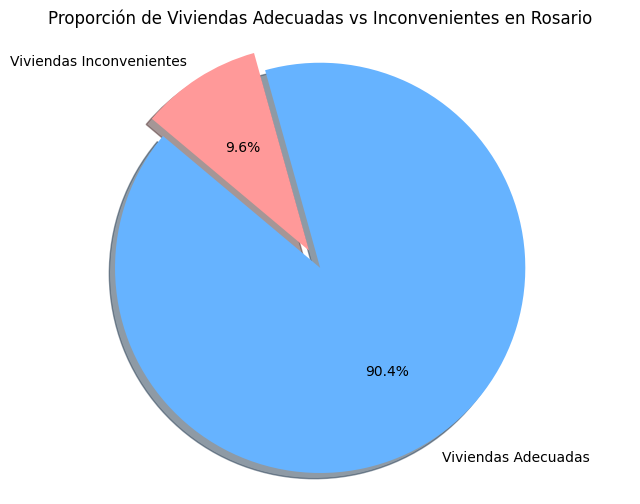

In [72]:
# Grafico de torta de vivienda inconveniente y vivienda adecuada 
labels = ['Viviendas Adecuadas', 'Viviendas Inconvenientes']
sizes = [total_viviendas_adecuadas, total_viviendas_inconvenientes]
colors = ['#66b3ff', '#ff9999']
explode = (0.1, 0)  # solo "explota" el primer slice    
plt.figure(figsize=(8, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Proporción de Viviendas Adecuadas vs Inconvenientes en Rosario")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

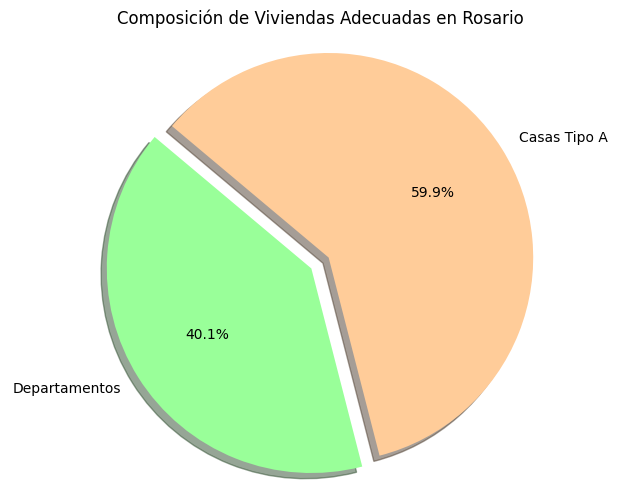

In [74]:
# Grafico de torta de como se compone Vivienda Adecuadas
labels = ['Departamentos', 'Casas Tipo A']
sizes = [
    datos_censales_con_gdf['viv_departamento'].sum(),
    datos_censales_con_gdf['viv_casa_a'].sum()
]
colors = ['#99ff99', '#ffcc99']
explode = (0.1, 0)  # solo "explota" el primer slice    
plt.figure(figsize=(8, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Composición de Viviendas Adecuadas en Rosario")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

(-1.099999932013825, 1.0999999966386937, -1.09999994963598, 1.099999991861501)

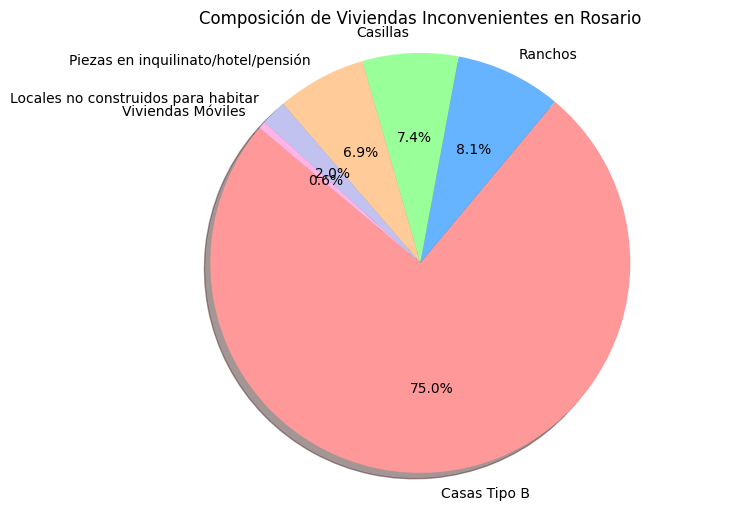

In [75]:
# Grafico de torta de como se compone Viviendas inconvenientes
labels = [
    'Casas Tipo B', 'Ranchos', 'Casillas', 
    'Piezas en inquilinato/hotel/pensión', 
    'Locales no construidos para habitar', 
    'Viviendas Móviles'
]
sizes = [
    datos_censales_con_gdf['viv_casa_b'].sum(),
    datos_censales_con_gdf['viv_rancho'].sum(),
    datos_censales_con_gdf['viv_casilla'].sum(),
    datos_censales_con_gdf['viv_pieza_inquilinato'].sum(),  
    datos_censales_con_gdf['viv_local_no_hab'].sum(),
    datos_censales_con_gdf['viv_vivienda_movil'].sum()
]
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6']
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Composición de Viviendas Inconvenientes en Rosario")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

In [76]:
datos_censales_con_gdf.columns

Index(['NOMPROV', 'PROV', 'NOMDEPTO', 'DEPTO', 'FRAC', 'RADIO', 'TIPO', 'LINK',
       'OBS2020', 'CodigoFraccion', 'CodigoRadioCensal', 'NBI_Hacinamiento_Si',
       'NBI_Hacinamiento_No', 'NBI_Vivienda_Si', 'NBI_Vivienda_No',
       'NBI_Sanitarias_Si', 'NBI_Sanitarias_No', 'NBI_Escolaridad_Si',
       'NBI_Escolaridad_No', 'NBI_Subsistencia_Si', 'NBI_Subsistencia_No',
       'NBI_Si', 'NBI_No', 'Sin_IPMH', 'IPMH_Solo_Recursos_Corrientes',
       'IPMH_Solo_Recursos_Patrimoniales', 'IPMH_Convergente', 'Total_Hogares',
       'Total_Poblacion', 'hogares_en_casa_a', 'hogares_en_casa_b',
       'hogares_en_rancho', 'hogares_en_casilla', 'hogares_en_departamento',
       'hogares_en_pieza_inquilinato', 'hogares_en_local_no_hab',
       'hogares_en_vivienda_movil', 'viv_casa_a', 'viv_casa_b', 'viv_rancho',
       'viv_casilla', 'viv_departamento', 'viv_pieza_inquilinato',
       'viv_local_no_hab', 'viv_vivienda_movil', 'Total_Viviendas',
       'tasa_NBI_%', 'NBI_Si_tasa_categorizado', '

In [78]:
# Calculamos las tasa de las viviendas inconvenientes y las viviendas adecuadas 
datos_censales_con_gdf['tasa_viviendas_adecuadas_%'] = datos_censales_con_gdf['viviendas_adecuadas'] / datos_censales_con_gdf['Total_Viviendas'] * 100
datos_censales_con_gdf['tasa_viviendas_inconvenientes_%'] = datos_censales_con_gdf['viviendas_inconvenientes'] / datos_censales_con_gdf['Total_Viviendas'] * 100

In [79]:
# Vemos las tasas calculadas anteriormente
datos_censales_con_gdf[['tasa_viviendas_adecuadas_%', 'tasa_viviendas_inconvenientes_%']].head(10)

,tasa_viviendas_adecuadas_%,tasa_viviendas_inconvenientes_%
0,33.969466,66.030534
1,98.591549,1.408451
2,87.815126,12.184874
3,89.327146,10.672854
4,86.666667,13.333333
5,87.536232,12.463768
6,99.492386,0.507614
7,70.742358,29.257642
8,95.169082,4.830918
9,73.799127,26.200873


(-60.80705341449993,
 -60.58220121549999,
 -33.04731163649994,
 -32.861883173499976)

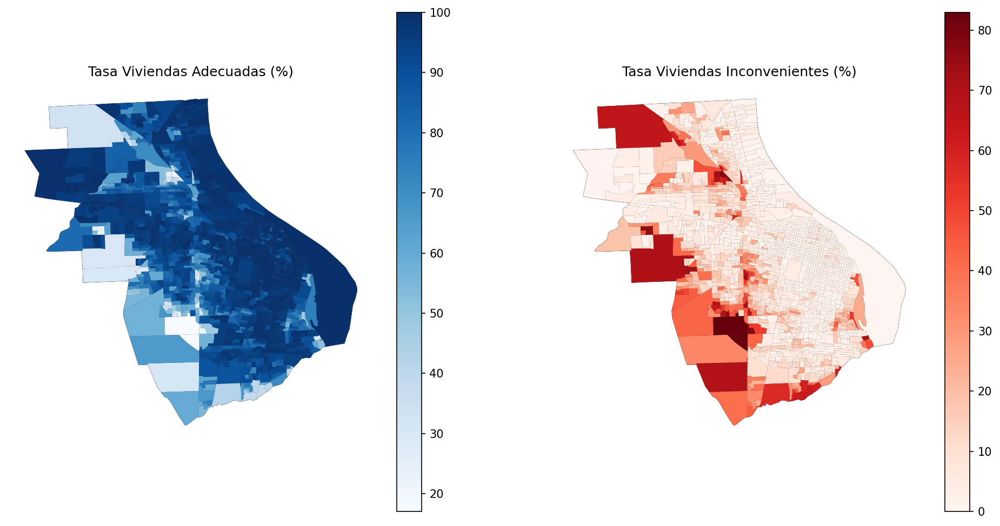

In [91]:
# Mapa comparativo: Viviendas adecuadas vs inconvenientes
fig, axes = plt.subplots(1, 2, figsize=(16, 8), dpi=150)

datos_censales_con_gdf.plot(ax=axes[0], color="lightgrey", edgecolor="black", linewidth=0.3)
datos_censales_con_gdf.plot(
    column='tasa_viviendas_adecuadas_%',
    cmap='Blues',
    legend=True,
    ax=axes[0]
)

axes[0].set_title('Tasa Viviendas Adecuadas (%)')
axes[0].axis('off')

datos_censales_con_gdf.plot(ax=axes[1], color="lightgrey", edgecolor="black", linewidth=0.3)
datos_censales_con_gdf.plot(
    column='tasa_viviendas_inconvenientes_%',
    cmap='Reds',
    legend=True,
    ax=axes[1]
)

axes[1].set_title('Tasa Viviendas Inconvenientes (%)')
axes[1].axis('off')

In [84]:
# Tabla top radios
top_inconv = datos_censales_con_gdf.nlargest(10, 'tasa_viviendas_inconvenientes_%')[
    ['CodigoRadioCensal','tasa_viviendas_inconvenientes_%','viviendas_inconvenientes','Total_Viviendas','Total_Hogares']
].reset_index(drop=True)

print("\nTop 10 radios por tasa de viviendas inconvenientes:")
display(top_inconv)


Top 10 radios por tasa de viviendas inconvenientes:


,CodigoRadioCensal,tasa_viviendas_inconvenientes_%,viviendas_inconvenientes,Total_Viviendas,Total_Hogares
0,820844915,82.938389,175,211,216
1,820844827,82.558140,142,172,176
2,820844824,77.960526,237,304,310
3,820841020,76.997579,318,413,423
4,820844914,75.907591,230,303,310
5,820848418,75.289575,195,259,262
6,820841035,73.200000,183,250,255
7,820843330,73.076923,190,260,266
8,820843517,72.368421,220,304,310
9,820844719,72.264631,284,393,410


----------------------------

## ReNaBaP (Registro Nacional Barrios Populares)

Los barrios que se incluyen son aquellos donde viven al menos 8 familias, más de la mitad no tiene título de propiedad del suelo y no acceden a dos servicios básicos (agua, cloacas o electricidad con medidor). 

In [92]:
# Leemos los datos del Renabap
renabap = gdp.read_file("../data/external/renabap/renabap_mapa.gpkg")

In [93]:
renabap_rosario = renabap[renabap["localidad"] == "Rosario"]

In [97]:
datos_censales_con_gdf[["CodigoRadioCensal", "Total_Hogares", "Total_Viviendas"]].head(10)

,CodigoRadioCensal,Total_Hogares,Total_Viviendas
0,820840301,267,262
1,820840302,285,284
2,820840303,240,238
3,820840304,439,431
4,820840305,243,240
5,820840306,351,345
6,820840307,201,197
7,820840308,230,229
8,820840309,207,207
9,820840310,232,229


In [99]:
# Total de viviendas particulares ocupadas
total_viviendas_suma = datos_censales_con_gdf['Total_Viviendas'].sum()
print("Total de viviendas particulares ocupadas (suma de radios censales):", total_viviendas_suma)

# Total de hogares en Rosario 
total_hogares_suma = datos_censales_con_gdf['Total_Hogares'].sum()
print("Total de hogares en Rosario (suma de radios censales):", total_hogares_suma)

Total de viviendas particulares ocupadas (suma de radios censales): 396456
Total de hogares en Rosario (suma de radios censales): 402085


In [110]:
# Agregamos una columna si el total de viviendas supera el total de hogares
datos_censales_con_gdf['viviendas_mas_que_hogares'] = (
    datos_censales_con_gdf['Total_Viviendas'] > datos_censales_con_gdf['Total_Hogares']
).astype(int)

# Vemos si hay radios censales con mas viviendas que hogares
print(datos_censales_con_gdf['viviendas_mas_que_hogares'].value_counts())

# Borramos la columna
datos_censales_con_gdf.drop(columns=['viviendas_mas_que_hogares'], inplace=True)

viviendas_mas_que_hogares
0    1536
Name: count, dtype: int64


Análisis Exploratorio de Datos ReNaBaP

In [112]:
renabap_rosario.columns

Index(['id_renabap', 'nombre_barrio', 'provincia', 'departamento', 'localidad',
       'cantidad_viviendas_aproximadas', 'cantidad_familias_aproximada',
       'decada_de_creacion', 'anio_de_creacion', 'energia_electrica',
       'efluentes_cloacales', 'agua_corriente', 'cocina', 'calefaccion',
       'titulo_propiedad', 'clasificacion_barrio', 'superficie_m2',
       'geometry'],
      dtype='object')

In [113]:
# Vemos los 'energia_electrica', 'efluentes_cloacales' y 'agua_corriente' del renabap   
renabap_rosario[['energia_electrica', 'efluentes_cloacales', 'agua_corriente', 'cocina', 'calefaccion']].describe()

,energia_electrica,efluentes_cloacales,agua_corriente,cocina,calefaccion
count,119,119,119,119,119
unique,4,5,7,3,5
top,Conexión irregular a la red,Desagüe sólo a pozo negro/ciego u hoyo,Conexión irregular a la red de agua,Gas en garrafa,Energía eléctrica
freq,110,83,101,115,82


In [114]:
#Vemos categorias de 'energia_electrica'
display(renabap_rosario['energia_electrica'].value_counts())
# Vemos categorias de 'efluentes_cloacales'
display(renabap_rosario['efluentes_cloacales'].value_counts())
# Vemos categorias de 'agua_corriente'
display(renabap_rosario['agua_corriente'].value_counts())
# Vemos categorias de 'cocina'
display(renabap_rosario['cocina'].value_counts())   
# Vemos categorias de 'calefaccion'
display(renabap_rosario['calefaccion'].value_counts())

energia_electrica
Conexión irregular a la red                                                110
Conexión formal a la red con medidor domiciliario con factura                5
Conexión a la red con medidor comunitario                                    3
Conexión regular a la red con medidor domiciliario con consumo limitado      1
Name: count, dtype: int64

efluentes_cloacales
Desagüe sólo a pozo negro/ciego u hoyo    83
Desagüe a cámara séptica y pozo ciego     24
Red cloacal conectada a la red pluvial     4
Conexión formal a la red cloacal           4
Conexión irregular a la red cloacal        4
Name: count, dtype: int64

agua_corriente
Conexión irregular a la red de agua                     101
Camión cisterna                                           8
Bomba de agua de pozo domiciliaria                        5
Conexión formal a la red de agua con factura              2
Acarreo de baldes/recipientes desde fuera del barrio      1
Conexión regular a la red de agua pero sin factura        1
Bomba de agua de pozo comunitaria                         1
Name: count, dtype: int64

cocina
Gas en garrafa       115
Energía eléctrica      3
Leña o carbón          1
Name: count, dtype: int64

calefaccion
Energía eléctrica    82
Gas en garrafa       20
Leña o carbón        10
Inexistente           5
Sin Datos             2
Name: count, dtype: int64

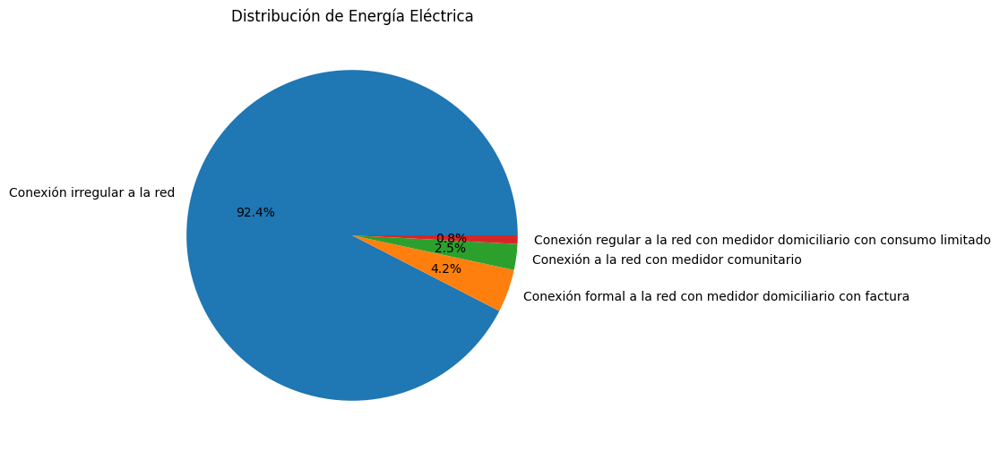

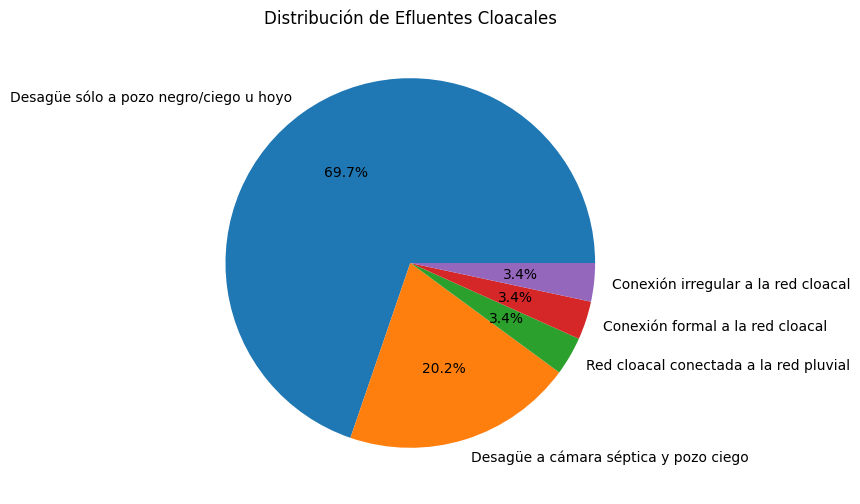

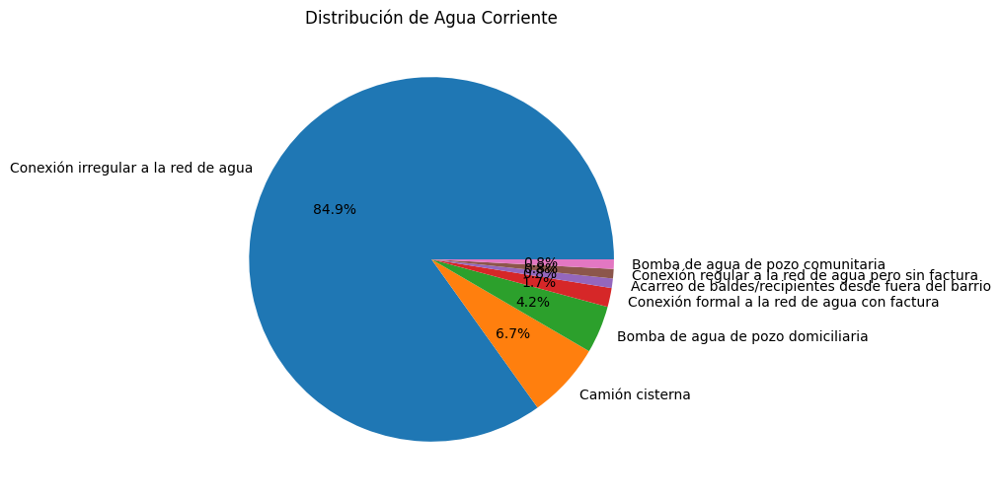

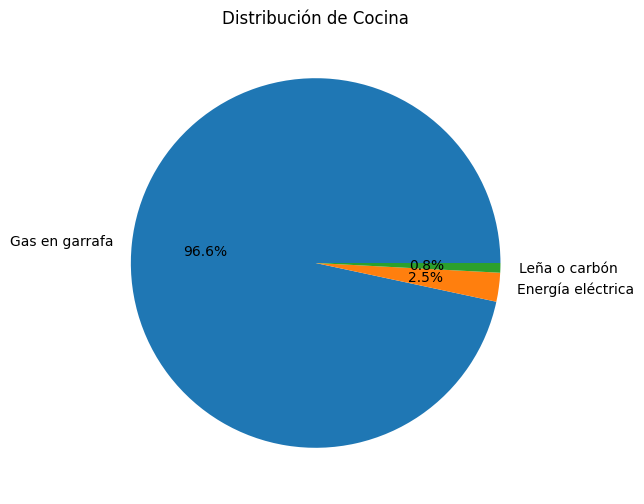

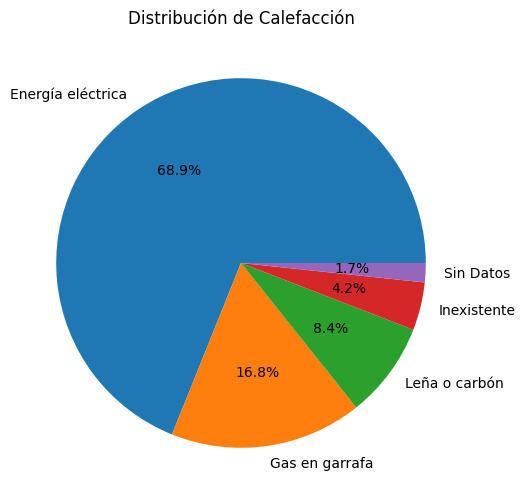

In [116]:
# Graficamos los diferentes tipos de variables que tenemos en el renabap_rosario (torta)

#Vemos categorias de 'energia_electrica'
plt.figure(figsize=(10, 6))
renabap_rosario['energia_electrica'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Distribución de Energía Eléctrica')
plt.ylabel('')
plt.show()

# Vemos categorias de 'efluentes_cloacales'
plt.figure(figsize=(10, 6))
renabap_rosario['efluentes_cloacales'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Distribución de Efluentes Cloacales')
plt.ylabel('')
plt.show()

# Vemos categorias de 'agua_corriente'
plt.figure(figsize=(10, 6))
renabap_rosario['agua_corriente'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Distribución de Agua Corriente')
plt.ylabel('')
plt.show()

# Vemos categorias de 'cocina'
plt.figure(figsize=(10, 6))
renabap_rosario['cocina'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Distribución de Cocina')
plt.ylabel('')
plt.show()

# Vemos categorias de 'calefaccion'
plt.figure(figsize=(10, 6))
renabap_rosario['calefaccion'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Distribución de Calefacción')
plt.ylabel('')
plt.show()

-----------------

Verificamos primero si ambas capas estan en el mismo sistema y si coinciden.

In [117]:
print(renabap_rosario.crs)
print(datos_censales_con_gdf.crs)

EPSG:4326
EPSG:4326


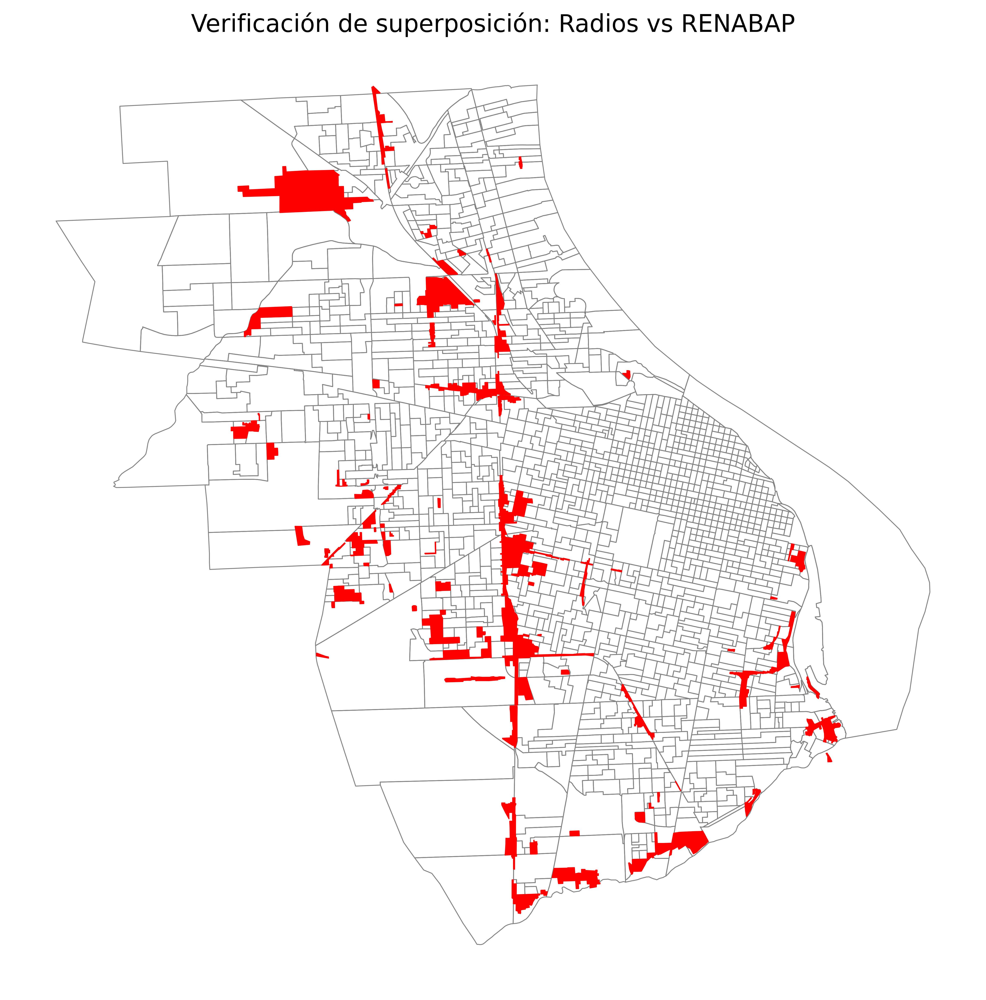

In [118]:
# Deberian coincidir las lineas negras (Datos censales) con las otras lineas rojas (del renabap)

fig, ax = plt.subplots(figsize=(10,10), dpi=600)

datos_censales_con_gdf.plot(ax=ax, color="none", edgecolor="grey", linewidth=0.5)

renabap_rosario.plot(ax=ax, color="red", edgecolor="red", linewidth=0.5)

ax.set_title("Verificación de superposición: Radios vs RENABAP", fontsize=14)
ax.axis("off")
plt.show()

Efectivamente, la capa GIS rel ReNaBaP coinciden con la capa GIS de los datos censales. Por lo tanto nos sirve para el siguiente análisis:

In [119]:
#Vemos total de barrios en el departamentos Rosario
print("Total de barrios en el Departamento ROSARIO:",len(renabap_rosario))

Total de barrios en el Departamento ROSARIO: 119


Ahora vamos a cruzarlo con los datos obtenidos en el Censo 2022

In [120]:
datos_censales_con_gdf.columns

Index(['NOMPROV', 'PROV', 'NOMDEPTO', 'DEPTO', 'FRAC', 'RADIO', 'TIPO', 'LINK',
       'OBS2020', 'CodigoFraccion', 'CodigoRadioCensal', 'NBI_Hacinamiento_Si',
       'NBI_Hacinamiento_No', 'NBI_Vivienda_Si', 'NBI_Vivienda_No',
       'NBI_Sanitarias_Si', 'NBI_Sanitarias_No', 'NBI_Escolaridad_Si',
       'NBI_Escolaridad_No', 'NBI_Subsistencia_Si', 'NBI_Subsistencia_No',
       'NBI_Si', 'NBI_No', 'Sin_IPMH', 'IPMH_Solo_Recursos_Corrientes',
       'IPMH_Solo_Recursos_Patrimoniales', 'IPMH_Convergente', 'Total_Hogares',
       'Total_Poblacion', 'hogares_en_casa_a', 'hogares_en_casa_b',
       'hogares_en_rancho', 'hogares_en_casilla', 'hogares_en_departamento',
       'hogares_en_pieza_inquilinato', 'hogares_en_local_no_hab',
       'hogares_en_vivienda_movil', 'viv_casa_a', 'viv_casa_b', 'viv_rancho',
       'viv_casilla', 'viv_departamento', 'viv_pieza_inquilinato',
       'viv_local_no_hab', 'viv_vivienda_movil', 'Total_Viviendas',
       'tasa_NBI_%', 'NBI_Si_tasa_categorizado', '

In [122]:
# Vemos top 20 radios con mayor tasa de viviendas inconvenientes
datos_censales_con_gdf.nlargest(20, "tasa_viviendas_inconvenientes_%")[[
    "CodigoRadioCensal", "tasa_viviendas_inconvenientes_%", 'Total_Viviendas'
]]

,CodigoRadioCensal,tasa_viviendas_inconvenientes_%,Total_Viviendas
99,820844915,82.938389,211
1169,820844827,82.558140,172
1166,820844824,77.960526,304
277,820841020,76.997579,413
98,820844914,75.907591,303
1459,820848418,75.289575,259
292,820841035,73.200000,250
798,820843330,73.076923,260
849,820843517,72.368421,304
1131,820844719,72.264631,393


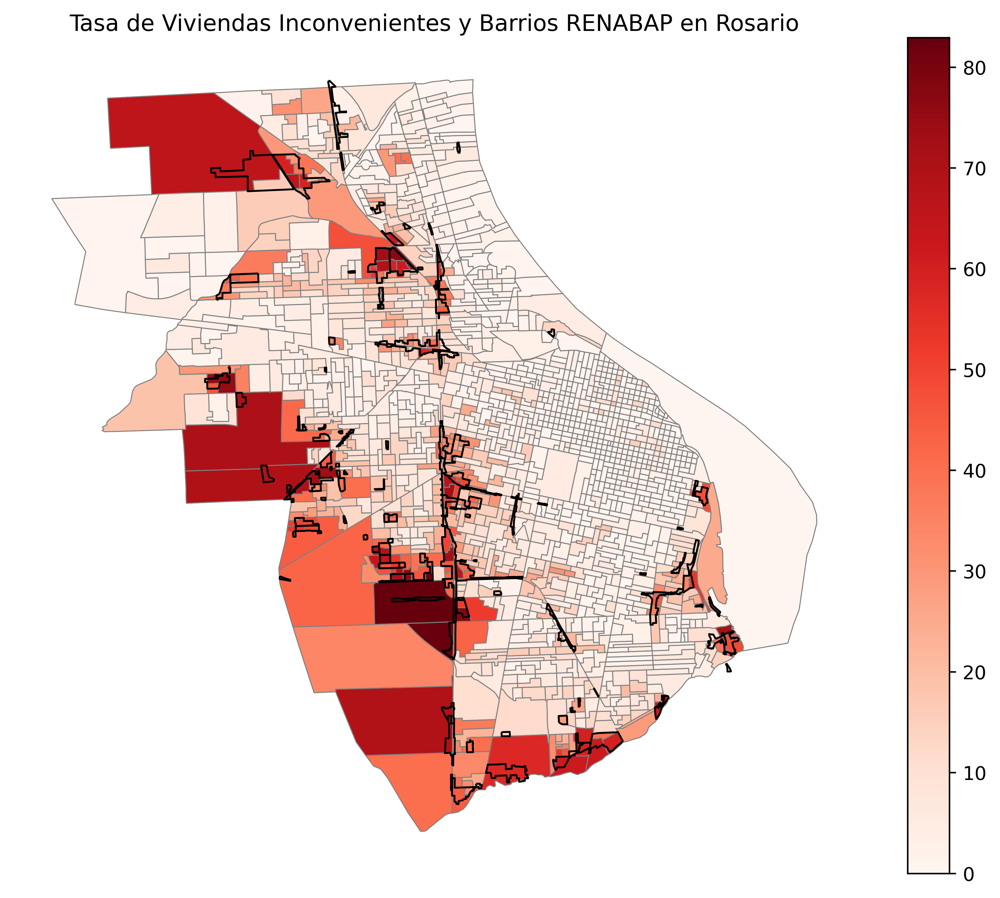

In [123]:
# Graficamos
fig, ax = plt.subplots(figsize=(10,8),dpi=500)
datos_censales_con_gdf.plot(ax=ax, color="none", edgecolor="grey", linewidth=0.5)
datos_censales_con_gdf.plot(column='tasa_viviendas_inconvenientes_%', cmap='Reds', legend=True, ax=ax)
renabap_rosario.boundary.plot(ax=ax, color='black', linewidth=1)
datos_censales_con_gdf.plot(ax=ax, color="none", edgecolor="grey", linewidth=0.5)

plt.title("Tasa de Viviendas Inconvenientes y Barrios RENABAP en Rosario")
plt.axis('off')
plt.show()

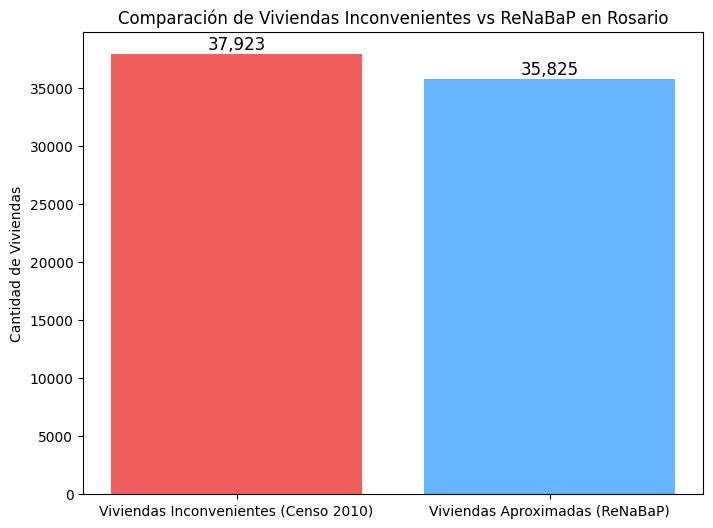

In [124]:
# Vemos el total de viviendas que tenemos clasificadas como inconvenientes
# y el total de viviendas que tenemos en el renabap (son aproximadas) 
total_viviendas_inconvenientes_ = datos_censales_con_gdf['viviendas_inconvenientes'].sum()
total_viviendas_aprox_renabap = renabap_rosario['cantidad_viviendas_aproximadas'].sum()

labels = ['Viviendas Inconvenientes (Censo 2010)', 'Viviendas Aproximadas (ReNaBaP)']
values = [total_viviendas_inconvenientes_, total_viviendas_aprox_renabap]

plt.figure(figsize=(8,6))
plt.bar(labels, values, color=["#f05e5e", '#66b3ff'])
plt.ylabel('Cantidad de Viviendas')
plt.title('Comparación de Viviendas Inconvenientes vs ReNaBaP en Rosario')
for i, v in enumerate(values):
    plt.text(i, v + max(values)*0.01, f'{v:,}', ha='center', fontsize=12)
plt.show()

La cantidad de viviendas aproximadas del Renabap es similar a las viviendas inconvenientes. El problema del renabap es que no sabemos cuando fueron actualizados los datos del mismos.

-------------------


#### Superposición Renabap - Viviendas Inconvenientes 


La idea de este enfoque sería poder responder a la pregunta: 
>¿Un radio censal que toca (o esta ubicado) en el RENABAP tiene en promedio, una tasa de viviendas inconvenientes significativamente mayor que uno que no lo toca (o no esta en un barrio popular)?

Despues, si ya tenemos las proporciones, podemos trasladas el análisis y responder tambien por ejemplo: 

- ¿A mayor proporción del área del radio cubierta por RENABAP, mayor es la tasa de viviendas inconvenientes? (estudiamos correlacion entre Proporcion_RENABAP y la variable dependiente $Y$ es tasa_viviendas_inconvenientes_%)


La idea es obtener porcentajes para ver con numeros como es la coincidencia de viviendas inconvenientes en barrios del ReNaBaP.

Intentamos probar la superposición de manera analítica. Hasta ahora vimos graficamente como se superponian Viviendas y Renabap

In [125]:
# Quitamos este radio censal que tiene una unica viviendas que es inconvenientes (outlier)
datos_censales_con_gdf_sin_820845602 = datos_censales_con_gdf[
    datos_censales_con_gdf["CodigoRadioCensal"] != 820845602
].copy()

------------------------

Antes de ver la superposicion entre nbi_vivienda y barrios populares (renabap), hay que hacer la **desagregación por radio censal**.

1. __Aproximación Binaria (Toca/No Toca)__ 

Clasifica el Radio Censal de forma simple: 1 (Sí) si cualquier parte del polígono del Radio Censal se superpone o toca un polígono del RENABAP, y 0 (No) en caso contrario. Es el método más rápido para un contraste de medias, demostrando si la mera presencia de un barrio popular está asociada a mayores tasas de déficit (ej. viviendas inconvenientes) en el promedio del radio, ignorando la intensidad del impacto.

2. __Aproximación por Proporcion de Superficie (Intensidad de Área)__

Asigna al Radio Censal un valor continuo (entre 0% y 100%) que representa el porcentaje del área total del radio que está cubierto por un polígono del RENABAP. Permite demostrar que el déficit habitacional no solo existe, sino que aumenta gradualmente a medida que mayor proporción del territorio del radio está ocupado por un barrio popular.

- Suposición: La población y las variables de déficit se distribuyen uniformemente (homogéneamente) dentro de los límites del Radio Censal.


##### 1. Aproximación Binaria 

Creamos variable (**en_renabap**) donde tiene 1 si el Radio Censal intersecta un barrio popular, 0 si no.

In [126]:
# --- 1. Cruce Espacial entre Radios Censales y RENABAP ---
# Usamos 'how="left"' para mantener todos los radios censales (izquierda), 
# y 'predicate="intersects"' para identificar si tocan cualquier polígono de RENABAP.

# El resultado 'cruce_binario' contendrá una fila por cada par de radio-RENABAP que intersecta.
# Los radios que no intersectan tendrán valores NaN en las columnas de la derecha.
cruce_binario = gdp.sjoin(
    datos_censales_con_gdf, 
    renabap_rosario, 
    how="left", 
    predicate="intersects"
)

# --- 2. Creación del Indicador Binario (1/0) ---
# Si 'index_right' (el índice del GeoDataFrame de RENABAP) NO es nulo, significa que hubo intersección.
cruce_binario["en_renabap"] = np.where(
    cruce_binario.index_right.notna(), 
    1, # Hubo intersección (Toca el RENABAP)
    0  # No hubo intersección (No toca el RENABAP)
)

# --- 3. Consolidación de la Etiqueta Binaria por Radio Censal ---
# Si un Radio Censal intersecta DOS barrios RENABAP, tendrá dos filas, ambas con 'en_renabap = 1'.
# Necesitamos una sola etiqueta por radio: usamos 'max' para asegurar que si toca aunque sea una vez, se marque como 1.

# Se seleccionan las columnas clave: el código del radio y la nueva etiqueta.
etiquetas_renabap_binario = cruce_binario.groupby("CodigoRadioCensal").agg({
    "en_renabap": "max" # Si cualquier intersección es 1, el radio es 1
}).reset_index()

# --- 4. Unir la Etiqueta al DataFrame Original ---
# Unimos la nueva columna 'en_renabap' al GeoDataFrame original.
datos_censales_con_gdf = datos_censales_con_gdf.merge(
    etiquetas_renabap_binario, 
    on="CodigoRadioCensal", 
    how="left"
)

print("¡Variable 'en_renabap' (0 o 1) agregada al GeoDataFrame!")
print(datos_censales_con_gdf[['CodigoRadioCensal', 'en_renabap']].head())

¡Variable 'en_renabap' (0 o 1) agregada al GeoDataFrame!
   CodigoRadioCensal  en_renabap
0          820840301           1
1          820840302           0
2          820840303           0
3          820840304           0
4          820840305           1


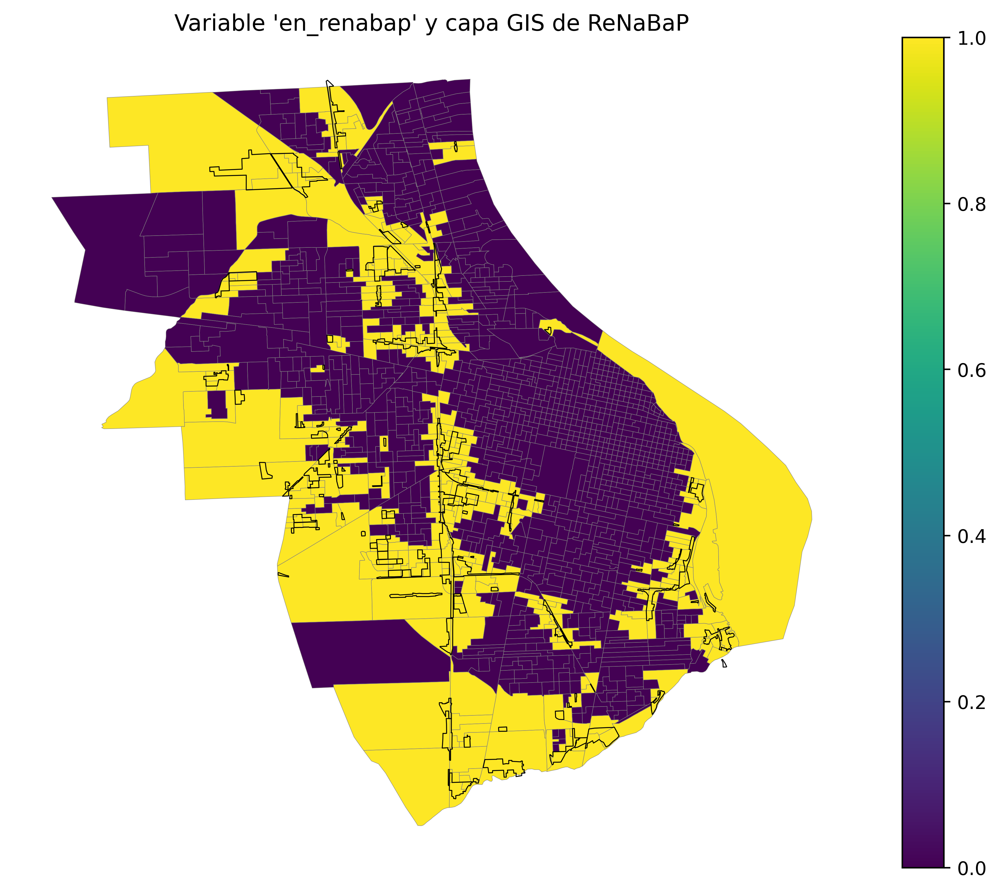

In [127]:
# Graficamos la variable 'en_renabap' para ver la primera aproximación
fig, ax = plt.subplots(figsize=(10,8),dpi=500)

datos_censales_con_gdf.plot(column='en_renabap', cmap='viridis', legend=True, ax=ax)
renabap_rosario.boundary.plot(ax=ax, color='black', linewidth=0.5)
datos_censales_con_gdf.plot(ax=ax, color="none", edgecolor="grey", linewidth=0.2)

plt.title("Variable 'en_renabap' y capa GIS de ReNaBaP")
plt.axis('off')
plt.show()

In [128]:
# Contraste de Medias de 'tasa_viviendas_inconvenientes_%' usando la nueva variable:

# 1. Agrupar por la etiqueta binaria y calcular la media de la tasa de viviendas inconvenientes
promedios_contraste = datos_censales_con_gdf.groupby("en_renabap")["tasa_viviendas_inconvenientes_%"].mean()

promedio_dentro = promedios_contraste.loc[1]
promedio_fuera = promedios_contraste.loc[0]

print("\n--- Resultados de la aproximación Binaria ---")
print(f"Promedio Tasa Inconvenientes (DENTRO del ReNaBaP): {round(promedio_dentro, 2)} %")
print(f"Promedio Tasa Inconvenientes (FUERA del ReNaBaP): {round(promedio_fuera, 2)} %")


--- Resultados de la aproximación Binaria ---
Promedio Tasa Inconvenientes (DENTRO del ReNaBaP): 26.59 %
Promedio Tasa Inconvenientes (FUERA del ReNaBaP): 4.54 %


In [130]:
# Lista de variables a comparar

variables_nbi = ['tasa_NBI_hacinamiento_%', 'tasa_NBI_vivienda_%',
       'tasa_NBI_sanitarias_%', 'tasa_NBI_escolaridad_%',
       'tasa_NBI_subsistencia_%']

variables_ipmh = ['tasa_Sin_IPMH_%', 'tasa_Solo_Corriente_%',
       'tasa_Solo_Patrimonial_%', 'tasa_Convergente_%']

variables_hogar_vivienda = ['tasa_hogares_unipersonales_%', 'tasa_viviendas_adecuadas_%',
       'tasa_viviendas_inconvenientes_%']

In [131]:
# ----------------------------------------------------
# Función para generar y formatear la tabla de contraste
# ----------------------------------------------------
def generar_tabla_contraste(df_original, lista_variables, titulo):
    # 1. Agrupar por la etiqueta binaria ('en_renabap') y calcular la media
    tabla_contraste = df_original.groupby("en_renabap")[lista_variables].mean()

    # 2. Renombrar el índice (0 y 1)
    tabla_contraste.index = ['FUERA de RENABAP (0)', 'DENTRO de RENABAP (1)']

    # 3. Aplicar redondeo a 2 decimales para la presentación
    tabla_contraste = tabla_contraste.round(2)
    
    # Imprimir el título para identificar la tabla
    print(f"--- {titulo} ---")
    
    # Devolver el DataFrame para que el notebook lo muestre con formato
    return pd.DataFrame(tabla_contraste)

# ----------------------------------------------------
# Generación de las 3 Tablas (Resultado directo en el notebook)
# ----------------------------------------------------

# Tabla 1: Componentes del NBI
tabla_nbi = generar_tabla_contraste(
    datos_censales_con_gdf, 
    variables_nbi, 
    "Contraste de Medias: Componentes del NBI"
)
# Mostrar el DataFrame de NBI
display(tabla_nbi) 

# Tabla 2: Componentes del IPMH (Privación Multidimensional)
tabla_ipmh = generar_tabla_contraste(
    datos_censales_con_gdf, 
    variables_ipmh, 
    "Contraste de Medias: Componentes del IPMH"
)
# Mostrar el DataFrame de IPMH
display(tabla_ipmh)

# Tabla 3: Indicadores de Hogar y Vivienda
tabla_hogar_vivienda = generar_tabla_contraste(
    datos_censales_con_gdf, 
    variables_hogar_vivienda, 
    "Contraste de Medias: Indicadores de Hogar y Vivienda"
)
# Mostrar el DataFrame de Hogar y Vivienda
display(tabla_hogar_vivienda)

--- Contraste de Medias: Componentes del NBI ---


,tasa_NBI_hacinamiento_%,tasa_NBI_vivienda_%,tasa_NBI_sanitarias_%,tasa_NBI_escolaridad_%,tasa_NBI_subsistencia_%
FUERA de RENABAP (0),1.03,1.21,0.19,0.51,0.24
DENTRO de RENABAP (1),4.71,3.07,1.45,1.49,0.96


--- Contraste de Medias: Componentes del IPMH ---


,tasa_Sin_IPMH_%,tasa_Solo_Corriente_%,tasa_Solo_Patrimonial_%,tasa_Convergente_%
FUERA de RENABAP (0),78.43,13.71,4.75,3.12
DENTRO de RENABAP (1),43.66,15.76,19.65,20.93


--- Contraste de Medias: Indicadores de Hogar y Vivienda ---


,tasa_hogares_unipersonales_%,tasa_viviendas_adecuadas_%,tasa_viviendas_inconvenientes_%
FUERA de RENABAP (0),33.95,95.46,4.54
DENTRO de RENABAP (1),20.03,73.41,26.59


##### 2. Aproximación por Proporción de Superficie 

Creamos la variable **proporcion_ReNaBaP**, que toma un valor continuo entre 0 y 1 e indica el área total de un Radio Censal que está físicamente cubierta o superpuesta por uno o varios polígonos del Registro Nacional de Barrios Populares

In [132]:
# Asegurarse de que ambos GeoDataFrames estén en el mismo Sistema de Coordenadas
# Proyectadas (CRS) para que el cálculo de área sea preciso (ej: UTM, EPSG:32720)
# Esto es CRÍTICO para calcular áreas correctamente.
print("CRS de datos_censales_con_gdf:", datos_censales_con_gdf.crs)
print("CRS de renabap_rosario:", renabap_rosario.crs)

CRS de datos_censales_con_gdf: EPSG:4326
CRS de renabap_rosario: EPSG:4326


Es necesario reproyectar a otro sistema cartográfico para cuando calculamos las proporciones hacerlo según la superficie en m2

In [133]:
# Cambiamos el CRS Proyectado (Web Mercator)
CRS_PROYECTADO = "EPSG:3857" 

# Vamos a re-proyectar ambos GeoDataFrames a EPSG:3857 
print(f"Reproyectando datos a {CRS_PROYECTADO} para cálculos de área en metros...")

# Reproyectar Radios Censales
datos_censales_con_gdf_proyectados = datos_censales_con_gdf.to_crs(CRS_PROYECTADO)
# Reproyectar RENABAP
renabap_rosario_proyectado = renabap_rosario.to_crs(CRS_PROYECTADO)

Reproyectando datos a EPSG:3857 para cálculos de área en metros...


In [134]:
# 1. Realizar la intersección geométrica
# El resultado son nuevos polígonos que representan SÓLO la parte donde se superponen.
interseccion_area = gdp.overlay(
    datos_censales_con_gdf_proyectados, 
    renabap_rosario_proyectado, 
    how='intersection',
    keep_geom_type=True
)

# 2. Calcular el área de la intersección (en la unidad del CRS, ej: metros cuadrados)
# Guardamos el área en una nueva columna.
interseccion_area['area_interseccion'] = interseccion_area.geometry.area

In [135]:
# 3. Agrupar el área de intersección por Radio Censal
# Un Radio Censal puede intersectar varios barrios RENABAP, por lo que sumamos todas las áreas superpuestas.
area_total_superpuesta = interseccion_area.groupby('CodigoRadioCensal')['area_interseccion'].sum().reset_index()

# Renombrar la columna del área para claridad
area_total_superpuesta.rename(columns={'area_interseccion': 'AreaTotalRENABAP_m2'}, inplace=True)

In [140]:
# 4. Unimos el área total superpuesta al GeoDataFrame original de Radios
datos_censales_con_gdf_proyectados = datos_censales_con_gdf_proyectados.merge(
    area_total_superpuesta, 
    on='CodigoRadioCensal', 
    how='left'
)

In [141]:
# 5. Rellenamos los valores nulos (NaN) con 0
# Un NaN significa que no hubo intersección, por lo tanto, el área es 0.
datos_censales_con_gdf_proyectados['AreaTotalRENABAP_m2'] = datos_censales_con_gdf_proyectados['AreaTotalRENABAP_m2'].fillna(0)

# 6. Nos aseguramos de que el GeoDataFrame de radios tenga la columna de su área total
# Si no la tiene, la creamos:
if 'AreaTotalRadio_m2' not in datos_censales_con_gdf_proyectados.columns:
    datos_censales_con_gdf_proyectados['AreaTotalRadio_m2'] = datos_censales_con_gdf_proyectados.geometry.area

# 7. Calculamos la Proporción RENABAP
# Proporcion = (Área Superpuesta) / (Área Total del Radio)
datos_censales_con_gdf_proyectados['Proporcion_RENABAP'] = (
    datos_censales_con_gdf_proyectados['AreaTotalRENABAP_m2'] / datos_censales_con_gdf_proyectados['AreaTotalRadio_m2']
)

In [153]:
# Convertimos a porcentaje (para visualización)
datos_censales_con_gdf_proyectados['Proporcion_RENABAP_%'] = (
    datos_censales_con_gdf_proyectados['Proporcion_RENABAP'] * 100
)

print("Variable 'Proporcion_RENABAP_%' agregada al DataFrame")
print(datos_censales_con_gdf_proyectados[['CodigoRadioCensal', 'Proporcion_RENABAP_%']].nlargest(10, 'Proporcion_RENABAP_%'))

Variable 'Proporcion_RENABAP_%' agregada al DataFrame
      CodigoRadioCensal  Proporcion_RENABAP_%
293           820841036            100.000000
809           820843404            100.000000
1131          820844719            100.000000
849           820843517             99.959099
1309          820845522             99.956300
279           820841022             99.697437
1130          820844718             99.550854
10            820840311             99.105723
1413          820848226             98.916529
213           820840721             98.182729


In [154]:
# Verificamos que la usma de Proporcion_RENABAP_% no supere 100% en ningún radio censal
max_proporcion = datos_censales_con_gdf_proyectados['Proporcion_RENABAP_%'].max()
print(f"\nMáxima Proporción RENABAP encontrada: {max_proporcion:.2f} %")


Máxima Proporción RENABAP encontrada: 100.00 %


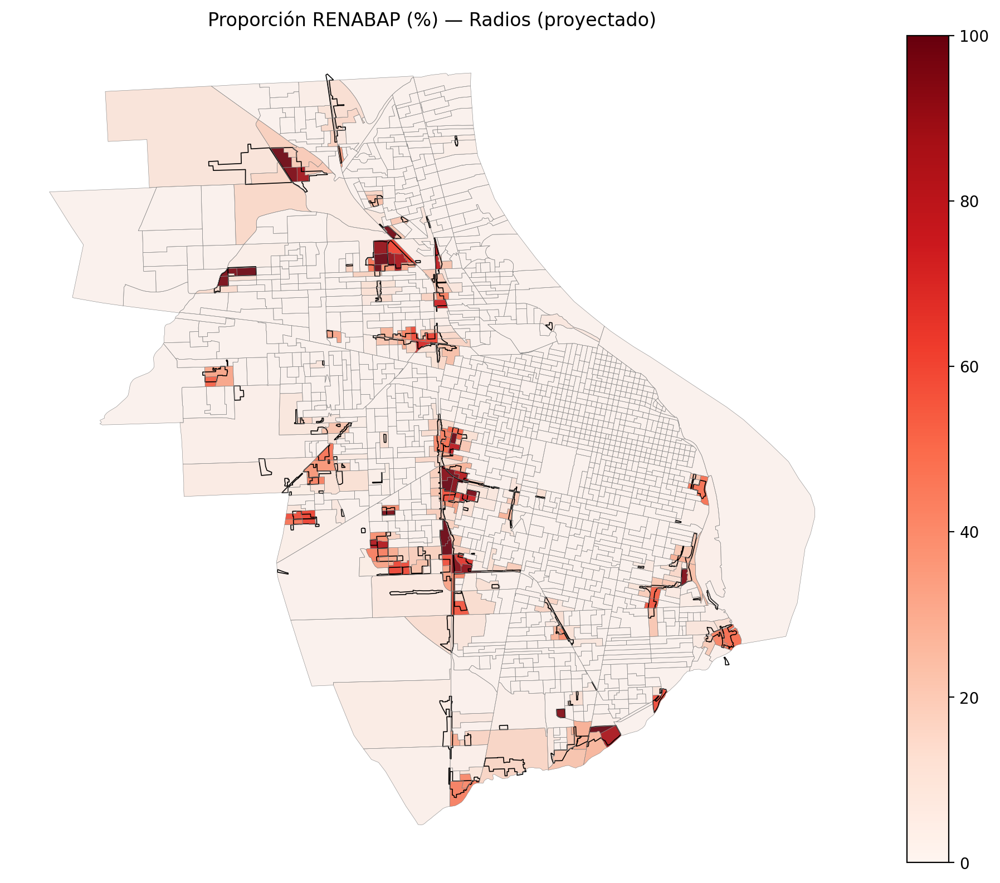

In [162]:
# Plot: primero fondo gris con todos los radios, luego overlay temático (evita blancos)
fig, ax = plt.subplots(figsize=(10, 8), dpi=200)

# Fondo: todos los radios visibles aunque tengan 0
datos_censales_con_gdf_proyectados.plot(
    ax=ax,
    color="lightgrey",
    edgecolor="white",
    linewidth=0.25
)

# Overlay temático (Proporción RENABAP)
datos_censales_con_gdf_proyectados.plot(
    column='Proporcion_RENABAP_%',
    cmap='Reds',
    legend=True,
    ax=ax,
    alpha=0.9,
    missing_kwds={'color': '#f0f0f0', 'label': 'sin dato'}
)

# Límite RENABAP (proyectado) y contornos para mejorar lectura
renabap_rosario_proyectado.boundary.plot(ax=ax, color='black', linewidth=0.6)
datos_censales_con_gdf_proyectados.boundary.plot(ax=ax, color='grey', linewidth=0.2)

ax.set_title("Proporción RENABAP (%) — Radios (proyectado)")
ax.axis('off')
plt.tight_layout()
plt.show()

----------

Por ejemplo ahora con las proporciones del ReNaBaP nos preguntamos: 

- ¿Aumenta la tasa de viviendas inconvenientes a medida que aumenta la proporción de ReNaBaP en el radio?

In [155]:
correlacion = datos_censales_con_gdf_proyectados['Proporcion_RENABAP'].corr(datos_censales_con_gdf_proyectados['tasa_viviendas_inconvenientes_%'])

print(f"\nCoeficiente de Correlación (Proporción RENABAP vs. Tasa Inconvenientes): {correlacion:.4f}")


Coeficiente de Correlación (Proporción RENABAP vs. Tasa Inconvenientes): 0.7223


Vemos entonces que el la cantidad de viviendas inconvenientes **aumenta con la intensidad de la superposición**.

In [156]:
# Estudiamos otras correlaciones entre Proporcion_RENABAP y tasa_viviendas_inconvenientes_% y 
# entre en_renabap y tasa_viviendas_inconvenientes_%

correlacion_proporcion = datos_censales_con_gdf_proyectados['Proporcion_RENABAP'].corr(datos_censales_con_gdf_proyectados['tasa_viviendas_inconvenientes_%'])
correlacion_binaria = datos_censales_con_gdf_proyectados['en_renabap'].corr(datos_censales_con_gdf_proyectados['tasa_viviendas_inconvenientes_%'])

print(f"Coeficiente de Correlación (Proporción RENABAP vs. Tasa Inconvenientes): {correlacion_proporcion:.4f}")
print(f"Coeficiente de Correlación (Variable Binaria vs. Tasa Inconvenientes): {correlacion_binaria:.4f}")

Coeficiente de Correlación (Proporción RENABAP vs. Tasa Inconvenientes): 0.7223
Coeficiente de Correlación (Variable Binaria vs. Tasa Inconvenientes): 0.6633


-----------------------------------------
Guardamos las variables calculadas en la proyección original.

In [164]:
# 1. Extraemos las variables calculadas del DataFrame proyectado
# (Solo necesitamos las columnas de datos, no la geometría)
variables_calculadas = datos_censales_con_gdf_proyectados[[
    'CodigoRadioCensal',
    'AreaTotalRENABAP_m2', 
    'AreaTotalRadio_m2',
    'Proporcion_RENABAP',
    'Proporcion_RENABAP_%'
]]

# 2. Luego si queremos hago el merge para agregarlo al dataset original